In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import svm
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from keras.callbacks import EarlyStopping, ModelCheckpoint

import tensorflow as tf
import keras
import glob
import cv2
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, Conv2DTranspose, AveragePooling2D, Lambda, Reshape
from keras.layers.normalization import BatchNormalization
from keras.layers import LSTM, Input, TimeDistributed
from keras.models import Model
from keras.optimizers import RMSprop, SGD
from keras import backend as K

from sklearn.model_selection import StratifiedKFold

import os
print(os.listdir("Manzanas"))

Using TensorFlow backend.
C:\Users\x-30679\Miniconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\x-30679\Miniconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\x-30679\Miniconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\x-30679\Miniconda3\lib\site-packages\tensorflow\python\framewo

['testManzanas', 'testOrange', 'TestPlatanos', 'trainManzanas', 'trainOrange', 'TrainPlatanos']


# Cargando y acomodando datos de entrenamiento


In [2]:
fruit_images = []
labels = [] 
for fruit_dir_path in glob.glob("Manzanas/TrainPlatanos/*"):
    fruit_label = fruit_dir_path.split("/")[-1]
    for image_path in glob.glob(os.path.join(fruit_dir_path, "*.png")):
        image = cv2.imread(image_path, cv2.IMREAD_COLOR)
        
        image = cv2.resize(image, (100, 100))
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        
        fruit_images.append(image)
        labels.append(fruit_label)
fruit_images = np.array(fruit_images)
labels = np.array(labels)

In [3]:
label_to_id_dict = {v:i for i,v in enumerate(np.unique(labels))}
id_to_label_dict = {v: k for k, v in label_to_id_dict.items()}

In [4]:
id_to_label_dict

{0: 'TrainPlatanos\\freshbanana', 1: 'TrainPlatanos\\rottenbanana'}

In [5]:
label_ids = np.array([label_to_id_dict[x] for x in labels])

In [6]:
label_ids.shape

(3805,)

In [7]:
scaler = StandardScaler()

In [8]:
images_scaled = scaler.fit_transform([i.flatten() for i in fruit_images])

In [9]:
pca = PCA(n_components=50)
pca_result = pca.fit_transform(images_scaled)

In [10]:
tsne = TSNE(n_components=2, perplexity=40.0)
tsne_result = tsne.fit_transform(pca_result)
tsne_result_scaled = StandardScaler().fit_transform(tsne_result)

# Definiendo visualización para las imagenes

In [11]:
def plot_image_grid(images, nb_rows, nb_cols, figsize=(5, 5)):
    assert len(images) == nb_rows*nb_cols, "Number of images should be the same as (nb_rows*nb_cols)"
    fig, axs = plt.subplots(nb_rows, nb_cols, figsize=figsize)
    
    n = 0
    for i in range(0, nb_rows):
        for j in range(0, nb_cols):
            # axs[i, j].xaxis.set_ticklabels([])
            # axs[i, j].yaxis.set_ticklabels([])
            axs[i, j].axis('off')
            axs[i, j].imshow(images[n])
            n += 1

def visualize_scatter_with_images(X_2d_data, images, figsize=(45,45), image_zoom=1):
    fig, ax = plt.subplots(figsize=figsize)
    artists = []
    for xy, i in zip(X_2d_data, images):
        x0, y0 = xy
        img = OffsetImage(i, zoom=image_zoom)
        ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(X_2d_data)
    ax.autoscale()
    plt.show()

def visualize_scatter(data_2d, label_ids, id_to_label_dict=None, figsize=(20,20)):
    if not id_to_label_dict:
        id_to_label_dict = {v:i for i,v in enumerate(np.unique(label_ids))}
    
    plt.figure(figsize=figsize)
    plt.grid()
    
    nb_classes = len(np.unique(label_ids))
    
    cmap = plt.cm.get_cmap("jet", nb_classes)
    
    for i, label_id in enumerate(np.unique(label_ids)):
        plt.scatter(data_2d[np.where(label_ids == label_id), 0],
                    data_2d[np.where(label_ids == label_id), 1],
                    marker='o',
                    c= cmap(i),
                    linewidth='5',
                    alpha=0.8,
                    label=id_to_label_dict[label_id])
    #plt.legend(loc='best')
    plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5),
          fancybox=True, shadow=True, ncol=1, fontsize=figsize[0])

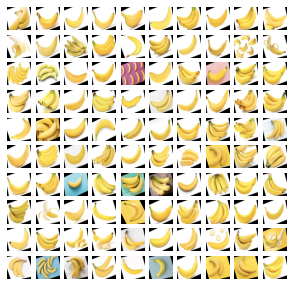

In [12]:
plot_image_grid(fruit_images[0:100], 10, 10)

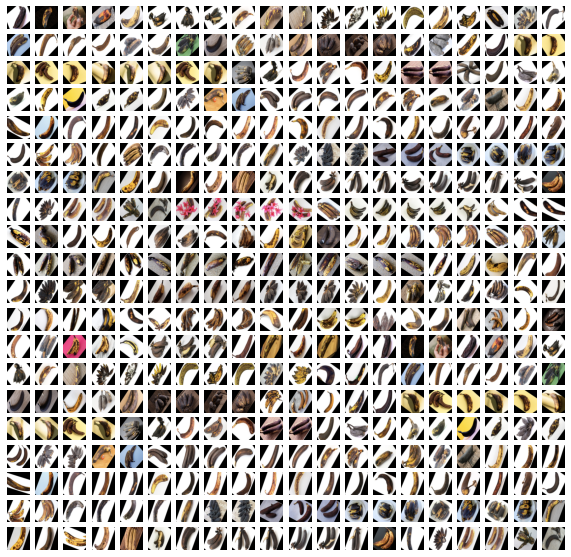

In [13]:
plot_image_grid(fruit_images[2000:2400], 20, 20, figsize=(10,10))

W0609 08:46:20.001671 10060 _axes.py:4222] 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
W0609 08:46:20.010647 10060 _axes.py:4222] 'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


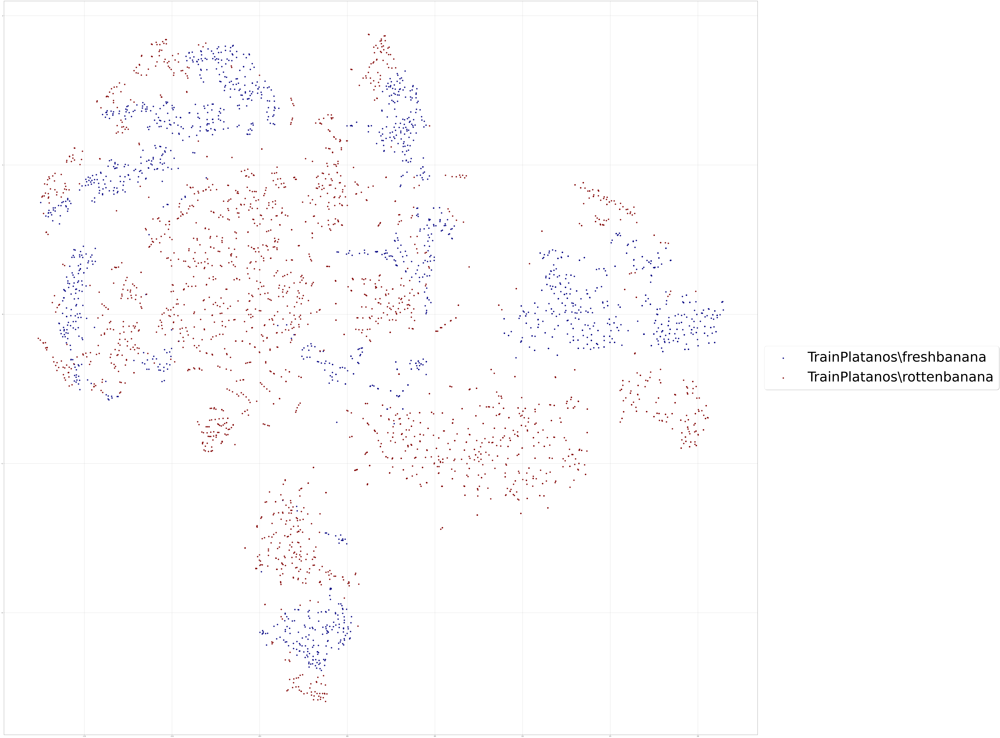

In [14]:
visualize_scatter(tsne_result_scaled, label_ids, id_to_label_dict, figsize=(100, 100))

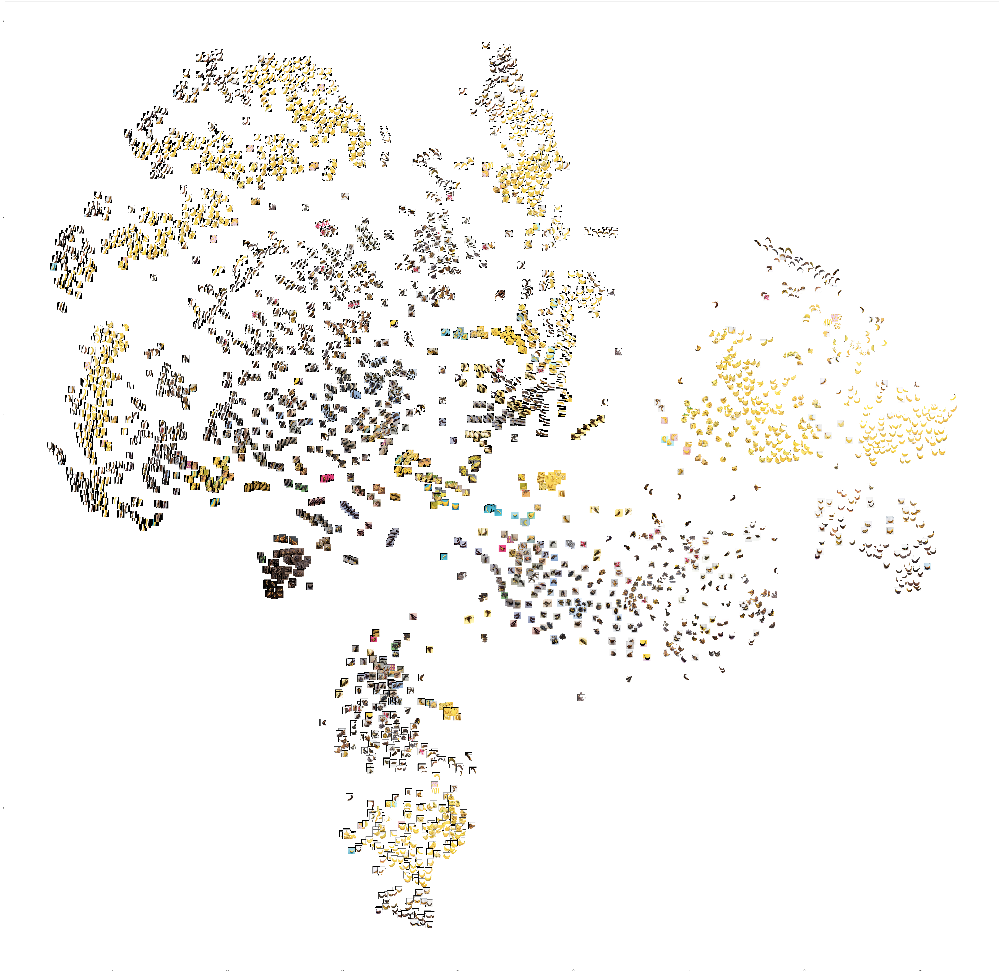

In [15]:
visualize_scatter_with_images(tsne_result_scaled, fruit_images, image_zoom=0.4, figsize=(100, 100))

In [16]:
fruit_images.shape, label_ids.shape, labels.shape

((3805, 100, 100, 3), (3805,), (3805,))

# Cargando datos de validación

In [17]:
validation_fruit_images = []
validation_labels = [] 
for fruit_dir_path in glob.glob("Manzanas/TestPlatanos/*"):
    fruit_label = fruit_dir_path.split("/")[-1]
    for image_path in glob.glob(os.path.join(fruit_dir_path, "*.png")):
        image = cv2.imread(image_path, cv2.IMREAD_COLOR)
        
        image = cv2.resize(image, (100, 100))
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        
        validation_fruit_images.append(image)
        validation_labels.append(fruit_label)
validation_fruit_images = np.array(validation_fruit_images)
validation_labels = np.array(validation_labels)

In [18]:
label_to_id_dict2 = {v:i for i,v in enumerate(np.unique(validation_labels))}
id_to_label_dict2 = {v: k for k, v in label_to_id_dict2.items()}

In [19]:
id_to_label_dict2

{0: 'TestPlatanos\\freshbanana', 1: 'TestPlatanos\\rottenbanana'}

In [20]:
validation_label_ids = np.array([label_to_id_dict2[x] for x in validation_labels])

In [21]:
validation_fruit_images.shape

(911, 100, 100, 3)

In [22]:
validation_label_ids.shape

(911,)

# Separando datos de train y test para utilizar

In [23]:
X_train, X_test = fruit_images, validation_fruit_images
Y_train, Y_test = label_ids, validation_label_ids

#Normalizando
X_train = X_train/255
X_test = X_test/255


X_flat_train = X_train.reshape(X_train.shape[0], 100*100*3)
X_flat_test = X_test.reshape(X_test.shape[0], 100*100*3)

Y_train = keras.utils.to_categorical(Y_train, 2)
Y_test = keras.utils.to_categorical(Y_test, 2)

print('Original Sizes:', X_train.shape, X_test.shape, Y_train.shape, Y_test.shape)
print('Flattened:', X_flat_train.shape, X_flat_test.shape)

Original Sizes: (3805, 100, 100, 3) (911, 100, 100, 3) (3805, 2) (911, 2)
Flattened: (3805, 30000) (911, 30000)


(100, 100, 3)


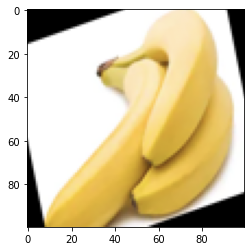

In [24]:
print(X_train[0].shape)
plt.imshow(X_train[0])
plt.show()

# Definiendo matriz de confusion y curva roc

In [25]:
# Código para graficar matriz de confusion

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                         title='Matriz de confusion',
                         cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    
    if normalize:
        cm=cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalizando matriz de confusion")
    else:
        print("La matriz de confusion sin normalizar")
    
    print(cm)
    
# QUEDA CORRIDO EL GRAFICO
#    thresh = cm.max() / 2.
#    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
#        plt.text(j, i, cm[i,j],
#                 horizontalalignment = "center",
#                 color= "white" if cm[i, j] > thresh else "black")
#    
#    plt.tight_layout()
#    plt.ylabel('True label')
#    plt.xlabel('Predict label')

In [26]:
#Matriz de conf
import itertools
from sklearn.metrics import roc_curve, auc, confusion_matrix
##CURVA ROC
import seaborn as sns
# roc curve and auc score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [27]:
#DEFINIENDO LA CURVA ROCK
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

In [28]:
X_flat_train.shape[1]

30000

# Probando la primera red neuronal simple con Validación Cruzada

In [35]:
skf = StratifiedKFold(n_splits=10)

In [41]:
results = []
for train_index, valid_index in skf.split(X_flat_train, label_ids):
    
    XX_train, yy_train =  X_flat_train[train_index], Y_train[train_index]
    XX_valid, yy_valid =  X_flat_train[valid_index], Y_train[valid_index]
    
    model_dense = Sequential()

    # Usando funcion de activacion RELU
    model_dense.add(Dense(128, activation='relu', input_shape=(X_flat_train.shape[1],)))
    # Capa Dropout para evitar sobreajuste y eliminar caracteristicas
    model_dense.add(Dropout(0.1))
    model_dense.add(Dense(64, activation='relu'))
    model_dense.add(Dropout(0.1))
    # El numero de unidades tiene que ser igual al numero de clases
    model_dense.add(Dense(2, activation='softmax'))

#     model_dense.summary()

    #-----------------------------aplicando early stopping-------
    epochs_to_wait_for_improve = 3
    early_stopping_callback = EarlyStopping(monitor='val_loss', 
                                            patience=epochs_to_wait_for_improve)

    checkpoint_callback = ModelCheckpoint('early.h5', 
                                          monitor='val_loss', 
                                          verbose=1, 
                                          save_best_only=True, 
                                          mode='min')
    #-----------------------------------------------------------------------

    model_dense.compile(loss='categorical_crossentropy',
                  optimizer=RMSprop(),
                  metrics=['accuracy'])

    history_dense = model_dense.fit(XX_train, yy_train,
                              batch_size=64,
                              epochs=2,
                              verbose=1,
                              validation_data=(XX_valid, yy_valid),
                              callbacks=[early_stopping_callback, checkpoint_callback])
    score_test  = model_dense.evaluate(X_flat_test, Y_test, verbose=0)
    score_train = model_dense.evaluate(XX_train, yy_train, verbose=0)
    score_valid = model_dense.evaluate(XX_valid, yy_valid, verbose=0)
    results.append([history_dense, score_train, score_valid, score_test, train_index, valid_index ])
    print('Test loss:', score_test[0])
    print('Test accuracy:', score_test[1])

W0609 09:04:30.736984 10060 deprecation_wrapper.py:119] From C:\Users\x-30679\Miniconda3\lib\site-packages\keras\backend\tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0609 09:04:30.805967 10060 deprecation_wrapper.py:119] From C:\Users\x-30679\Miniconda3\lib\site-packages\keras\backend\tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0609 09:04:30.816946 10060 deprecation_wrapper.py:119] From C:\Users\x-30679\Miniconda3\lib\site-packages\keras\backend\tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0609 09:04:30.842845 10060 deprecation_wrapper.py:119] From C:\Users\x-30679\Miniconda3\lib\site-packages\keras\backend\tensorflow_backend.py:133: The name tf.placeholder_with_default is deprecated. Please use tf.compat.v1.placeholder_with_default instead.

W0609 09:04:30.860821 10060 deprec

Train on 3423 samples, validate on 382 samples
Epoch 1/2
3423/3423 [==============================] - 7s 2ms/step - loss: 6.5730 - acc: 0.5849 - val_loss: 6.7088 - val_acc: 0.5838

Epoch 00001: val_loss improved from inf to 6.70884, saving model to early.h5
Epoch 2/2
3423/3423 [==============================] - 1s 412us/step - loss: 6.6959 - acc: 0.5846 - val_loss: 6.7088 - val_acc: 0.5838

Epoch 00002: val_loss did not improve from 6.70884
Test loss: 6.740937889211133
Test accuracy: 0.5817782656421515
Train on 3424 samples, validate on 381 samples
Epoch 1/2
3424/3424 [==============================] - 2s 516us/step - loss: 6.5829 - acc: 0.5824 - val_loss: 6.6841 - val_acc: 0.5853

Epoch 00001: val_loss improved from inf to 6.68414, saving model to early.h5
Epoch 2/2
3424/3424 [==============================] - 1s 404us/step - loss: 6.6986 - acc: 0.5844 - val_loss: 6.6841 - val_acc: 0.5853

Epoch 00002: val_loss did not improve from 6.68414
Test loss: 6.740937889211133
Test accuracy: 0

In [42]:
results

[[<keras.callbacks.History at 0x18873befba8>,
  [6.695860909224601, 0.5845749342681859],
  [6.708840803950253, 0.5837696335078534],
  [6.740937889211133, 0.5817782656421515],
  array([ 159,  160,  161, ..., 3802, 3803, 3804]),
  array([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,   10,
           11,   12,   13,   14,   15,   16,   17,   18,   19,   20,   21,
           22,   23,   24,   25,   26,   27,   28,   29,   30,   31,   32,
           33,   34,   35,   36,   37,   38,   39,   40,   41,   42,   43,
           44,   45,   46,   47,   48,   49,   50,   51,   52,   53,   54,
           55,   56,   57,   58,   59,   60,   61,   62,   63,   64,   65,
           66,   67,   68,   69,   70,   71,   72,   73,   74,   75,   76,
           77,   78,   79,   80,   81,   82,   83,   84,   85,   86,   87,
           88,   89,   90,   91,   92,   93,   94,   95,   96,   97,   98,
           99,  100,  101,  102,  103,  104,  105,  106,  107,  108,  109,
          110,  111,  1

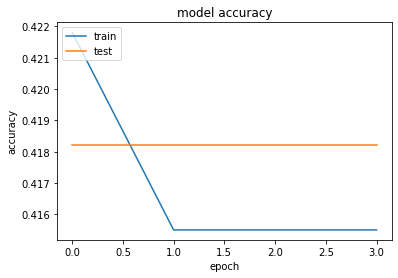

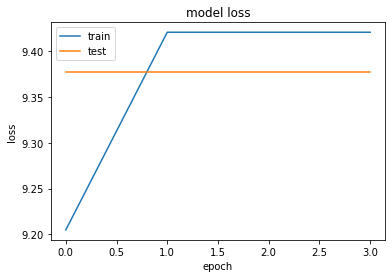

In [30]:
# summarize history for accuracy
plt.plot(history_dense.history['acc'])
plt.plot(history_dense.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history_dense.history['loss'])
plt.plot(history_dense.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [31]:
prediccion_dense = model_dense.predict(X_flat_test)

In [32]:
probs_dense = model_dense.predict_proba(X_flat_test)

In [33]:
clases_dense = model_dense.predict_classes(X_flat_test)

In [34]:
cm_dense= confusion_matrix(Y_test.argmax(axis=1), clases_dense)

La matriz de confusion sin normalizar
[[381   0]
 [530   0]]


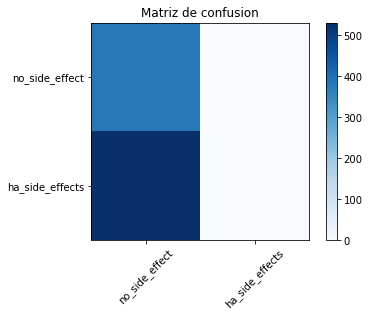

In [35]:
cm_plot_label = ['no_side_effect','ha_side_effects']
plot_confusion_matrix(cm_dense, cm_plot_label, title='Matriz de confusion')

In [36]:
probs_dense = probs_dense[:, 0]

In [37]:
auc_dense = roc_auc_score(Y_test.argmax(axis=1), probs_dense)

In [38]:
fpr, tpr, thresholds = roc_curve(Y_test.argmax(axis=1), probs_dense)

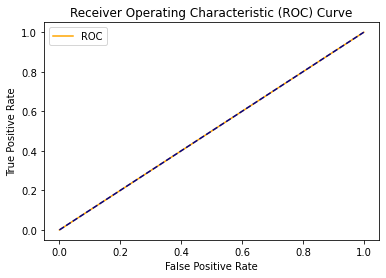

In [39]:
plot_roc_curve(fpr, tpr)

# Segunda red neuronal un poco mas profunda

In [40]:
model_deep = Sequential()

model_deep.add(Dense(256, activation='relu', input_shape=(X_flat_train.shape[1],)))

model_deep.add(Dropout(0.05))
model_deep.add(Dense(128, activation='relu'))
model_deep.add(Dropout(0.05))
model_deep.add(Dense(128, activation='relu'))
model_deep.add(Dropout(0.05))
model_deep.add(Dense(128, activation='relu'))
model_deep.add(Dropout(0.05))
model_deep.add(Dense(128, activation='relu'))
model_deep.add(Dropout(0.05))

model_deep.add(Dense(2, activation='softmax'))

model_deep.summary()

#-----------------------------aplicando early stopping-------
epochs_to_wait_for_improve = 5
early_stopping_callback = EarlyStopping(monitor='val_loss', 
                                        patience=epochs_to_wait_for_improve)

checkpoint_callback = ModelCheckpoint('early.h5', 
                                      monitor='val_loss', 
                                      verbose=1, 
                                      save_best_only=True, 
                                      mode='min')
#-----------------------------------------------------------------------

model_deep.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(),
              metrics=['accuracy'])

history_deep = model_deep.fit(X_flat_train, Y_train,
                          batch_size=128,
                          epochs=10,
                          verbose=1,
                          validation_data=(X_flat_test, Y_test),
                          callbacks=[early_stopping_callback, checkpoint_callback])
score = model_deep.evaluate(X_flat_test, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 256)               7680256   
_________________________________________________________________
dropout_3 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 128)               32896     
_________________________________________________________________
dropout_4 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 128)               16512     
_________________________________________________________________
dropout_5 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_7 (Dense)              (None, 128)               16512     
__________

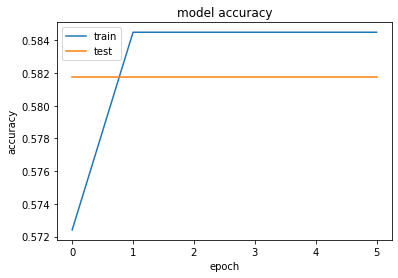

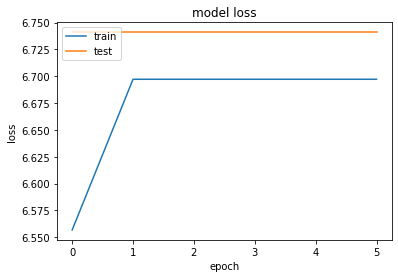

In [41]:
# summarize history for accuracy
plt.plot(history_deep.history['acc'])
plt.plot(history_deep.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history_deep.history['loss'])
plt.plot(history_deep.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

La matriz de confusion sin normalizar
[[  0 381]
 [  0 530]]


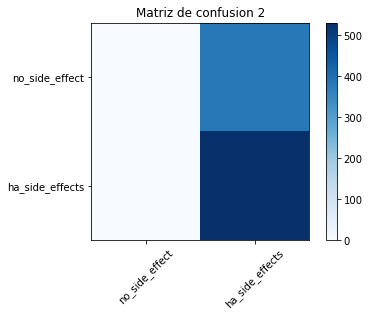

In [42]:
prediccion_deep = model_deep.predict(X_flat_test)
probs_deep = model_deep.predict_proba(X_flat_test)
clases_deep = model_deep.predict_classes(X_flat_test)


cm_deep= confusion_matrix(Y_test.argmax(axis=1), clases_deep)
cm_plot_label_deep = ['no_side_effect','ha_side_effects']
plot_confusion_matrix(cm_deep, cm_plot_label_deep, title='Matriz de confusion 2')

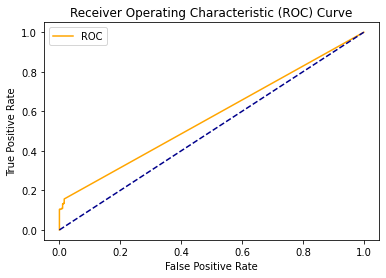

In [43]:
probs_deep = probs_deep[:, 0]
auc_deep = roc_auc_score(Y_test.argmax(axis=1), probs_deep)
fpr_deep, tpr_deep, thresholds = roc_curve(Y_test.argmax(axis=1), probs_deep)
plot_roc_curve(fpr_deep, tpr_deep)

# Tercera Red Neuronal aplicando Conv2d

In [44]:
model_cnn = Sequential()

model_cnn.add(Conv2D(16, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(100, 100, 3)))
model_cnn.add(Conv2D(32, (3, 3), activation='relu'))
model_cnn.add(MaxPooling2D(pool_size=(2, 2)))
model_cnn.add(Dropout(0.25))
model_cnn.add(Flatten())
model_cnn.add(Dense(64, activation='relu'))
model_cnn.add(Dropout(0.5))
model_cnn.add(Dense(2, activation='softmax'))

model_cnn.summary()



W0530 02:28:58.161808  8144 deprecation_wrapper.py:119] From C:\Users\x-30679\Miniconda3\lib\site-packages\keras\backend\tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.



_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 98, 98, 16)        448       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 96, 96, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 48, 48, 32)        0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 48, 48, 32)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 73728)             0         
_________________________________________________________________
dense_10 (Dense)             (None, 64)                4718656   
_________________________________________________________________
dropout_9 (Dropout)          (None, 64)                0         
__________

In [45]:
#-----------------------------aplicando early stopping-------
epochs_to_wait_for_improve = 4
early_stopping_callback = EarlyStopping(monitor='val_loss', 
                                        patience=epochs_to_wait_for_improve)

checkpoint_callback = ModelCheckpoint('early.h5', 
                                      monitor='val_loss', 
                                      verbose=1, 
                                      save_best_only=True, 
                                      mode='min')
#-----------------------------------------------------------------------

model_cnn.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

history_cnn= model_cnn.fit(X_train, Y_train,
          batch_size=128,
          epochs=25,
          verbose=1,
          validation_data=(X_test, Y_test),
          callbacks=[early_stopping_callback, checkpoint_callback])
score = model_cnn.evaluate(X_test, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 3805 samples, validate on 911 samples
Epoch 1/25
3805/3805 [==============================] - 8s 2ms/step - loss: 0.8839 - acc: 0.6972 - val_loss: 0.2615 - val_acc: 0.9089

Epoch 00001: val_loss improved from inf to 0.26155, saving model to early.h5
Epoch 2/25
3805/3805 [==============================] - 3s 862us/step - loss: 0.2056 - acc: 0.9014 - val_loss: 0.0530 - val_acc: 0.9901

Epoch 00002: val_loss improved from 0.26155 to 0.05300, saving model to early.h5
Epoch 3/25
3805/3805 [==============================] - 3s 840us/step - loss: 0.0993 - acc: 0.9703 - val_loss: 0.0286 - val_acc: 0.9956

Epoch 00003: val_loss improved from 0.05300 to 0.02860, saving model to early.h5
Epoch 4/25
3805/3805 [==============================] - 3s 852us/step - loss: 0.0898 - acc: 0.9761 - val_loss: 0.0368 - val_acc: 0.9912

Epoch 00004: val_loss did not improve from 0.02860
Epoch 5/25
3805/3805 [==============================] - 3s 865us/step - loss: 0.1028 - acc: 0.9740 - val_loss: 0.0196

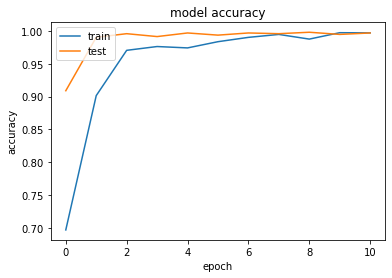

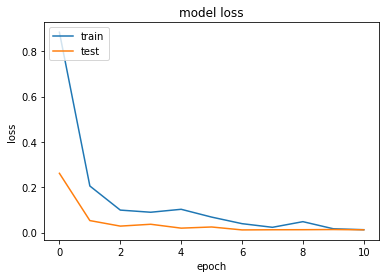

In [47]:
# summarize history for accuracy
plt.plot(history_cnn.history['acc'])
plt.plot(history_cnn.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history_cnn.history['loss'])
plt.plot(history_cnn.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [48]:
#Curva Roc

In [49]:
clases_cnn = model_cnn.predict_classes(X_test)

In [50]:
cm_cnn= confusion_matrix(Y_test.argmax(axis=1), clases_cnn)

La matriz de confusion sin normalizar
[[378   3]
 [  0 530]]


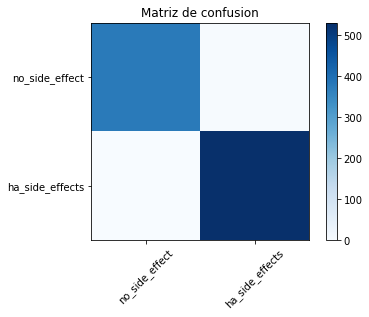

In [51]:
cm_plot_label = ['no_side_effect','ha_side_effects']
plot_confusion_matrix(cm_cnn, cm_plot_label, title='Matriz de confusion')

In [52]:
probs_cnn = model_cnn.predict_proba(X_test)

In [53]:
probs_cnn = probs_cnn[:, 1]

In [54]:
auc_cnn = roc_auc_score(Y_test.argmax(axis=1), probs_cnn)

In [55]:
fpr, tpr, thresholds = roc_curve(Y_test.argmax(axis=1), probs_cnn)

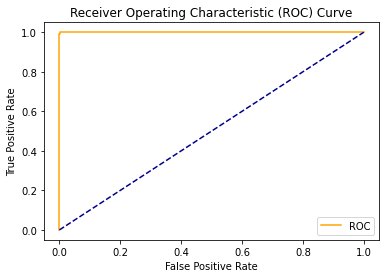

In [56]:
plot_roc_curve(fpr, tpr)

In [57]:
#PARA VOLVER A ENTRENAR
#model_cnn.fit(X_train, Y_train,
#          batch_size=32,
#          epochs=10,
#          verbose=1,
#          validation_data=(X_test, Y_test))
#score = model_cnn.evaluate(X_test, Y_test, verbose=0)
#print('Test loss:', score[0])
#print('Test accuracy:', score[1])

# Red neuronal extraida de paper para reconcimiento de arandanos

In [58]:
model_aran = Sequential()

model_aran.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(100, 100, 3)))
model_aran.add(MaxPooling2D(pool_size=(2,2)))
model_aran.add(Conv2D(64, kernel_size=(3,3), activation='relu'))
model_aran.add(MaxPooling2D(pool_size=(2,2)))
model_aran.add(Flatten())
model_aran.add(Dense(128, activation='relu'))
model_aran.add(Dropout(0.25))
model_aran.add(Dense(2, activation='softmax'))



model_aran.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 98, 98, 32)        896       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 47, 47, 64)        18496     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 23, 23, 64)        0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 33856)             0         
_________________________________________________________________
dense_12 (Dense)             (None, 128)               4333696   
_________________________________________________________________
dropout_10 (Dropout)         (None, 128)               0         
__________

In [59]:
model_aran.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

history_aran= model_aran.fit(X_train, Y_train,
          batch_size=64,
          epochs=10,
          verbose=1,
          validation_data=(X_test, Y_test))
score = model_aran.evaluate(X_test, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 3805 samples, validate on 911 samples
Epoch 1/10
3805/3805 [==============================] - 4s 1ms/step - loss: 0.6800 - acc: 0.7382 - val_loss: 0.1124 - val_acc: 0.9748
Epoch 2/10
3805/3805 [==============================] - 3s 834us/step - loss: 0.0740 - acc: 0.9790 - val_loss: 0.0297 - val_acc: 0.9956
Epoch 3/10
3805/3805 [==============================] - 3s 836us/step - loss: 0.0455 - acc: 0.9861 - val_loss: 0.0246 - val_acc: 0.9956
Epoch 4/10
3805/3805 [==============================] - 3s 860us/step - loss: 0.0295 - acc: 0.9919 - val_loss: 0.0179 - val_acc: 0.9967
Epoch 5/10
3805/3805 [==============================] - 3s 838us/step - loss: 0.0377 - acc: 0.9887 - val_loss: 0.0140 - val_acc: 0.9978
Epoch 6/10
3805/3805 [==============================] - 3s 831us/step - loss: 0.0266 - acc: 0.9892 - val_loss: 0.0157 - val_acc: 0.9956
Epoch 7/10
3805/3805 [==============================] - 3s 838us/step - loss: 0.0122 - acc: 0.9966 - val_loss: 0.0100 - val_acc: 0.9978
Epo

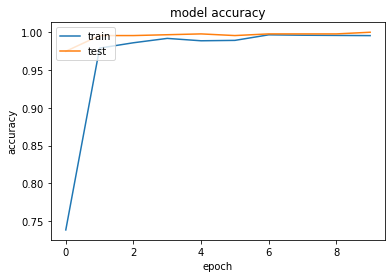

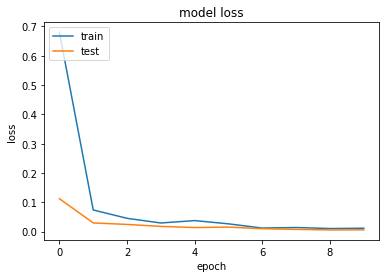

In [60]:
# summarize history for accuracy
plt.plot(history_aran.history['acc'])
plt.plot(history_aran.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history_aran.history['loss'])
plt.plot(history_aran.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [61]:
predict_clases = model_aran.predict_classes(X_test)
prediccion = model_aran.predict(X_test)

In [62]:
cm_aran= confusion_matrix(Y_test.argmax(axis=1), predict_clases)

La matriz de confusion sin normalizar
[[381   0]
 [  0 530]]


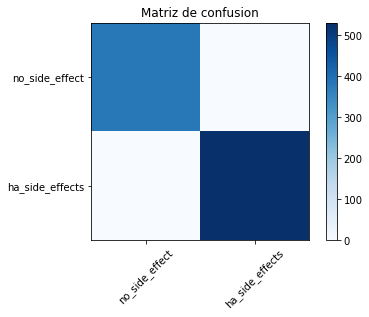

In [63]:
cm_plot_label = ['no_side_effect','ha_side_effects']
plot_confusion_matrix(cm_aran, cm_plot_label, title='Matriz de confusion')

In [64]:
probs = model_aran.predict_proba(X_test)

In [65]:
probs = probs[:, 1]

In [66]:
auc = roc_auc_score(Y_test.argmax(axis=1), probs)

In [67]:
print('AUC: %.2f' % auc)

AUC: 1.00


In [68]:
fpr, tpr, thresholds = roc_curve(Y_test.argmax(axis=1), probs)

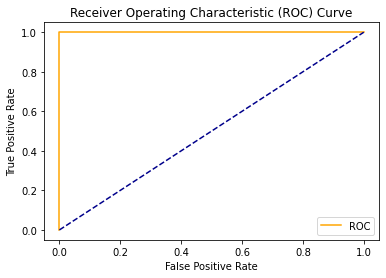

In [69]:
plot_roc_curve(fpr, tpr)

# Segunda Red utilizanda para arandanos (paper 2)

In [70]:
model_fruit = Sequential()

model_fruit.add(Conv2D(32, kernel_size=(3, 3), input_shape=(100, 100, 3)))

model_fruit.add(Conv2D(32,(3,3), activation='relu'))
model_fruit.add(MaxPooling2D(pool_size=(2,2)))
model_fruit.add(Conv2D(64,(3,3),activation='relu'))
model_fruit.add(Conv2D(64,(3,3),activation='relu'))
model_fruit.add(Dropout(0.25))
model_fruit.add(MaxPooling2D(pool_size=(2,2)))
model_fruit.add(Conv2D(128,(3,3),activation='relu'))
model_fruit.add(Conv2D(128,(3,3),activation='relu'))
model_fruit.add(Conv2D(128,(3,3),activation='relu'))
model_fruit.add(MaxPooling2D(pool_size=(2,2)))
model_fruit.add(Conv2D(256,(3,3),activation='relu'))
model_fruit.add(Conv2D(256,(3,3),activation='relu'))
model_fruit.add(Conv2D(256,(3,3),activation='relu'))
model_fruit.add(MaxPooling2D(pool_size=(2,2)))
model_fruit.add(Dropout(0.25))
model_fruit.add(Conv2DTranspose(512,(3,3), activation='relu'))
model_fruit.add(Flatten())
model_fruit.add(Dense(2, activation='softmax'))

model_fruit.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 98, 98, 32)        896       
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 96, 96, 32)        9248      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 48, 48, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 46, 46, 64)        18496     
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 44, 44, 64)        36928     
_________________________________________________________________
dropout_11 (Dropout)         (None, 44, 44, 64)        0         
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 22, 22, 64)        0         
__________

In [71]:
model_fruit.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

history_fruit= model_fruit.fit(X_train, Y_train,
          batch_size=64,
          epochs=10,
          verbose=1,
          validation_data=(X_test, Y_test))
score = model_fruit.evaluate(X_test, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 3805 samples, validate on 911 samples
Epoch 1/10
3805/3805 [==============================] - 9s 2ms/step - loss: 0.6999 - acc: 0.5879 - val_loss: 0.6807 - val_acc: 0.5818
Epoch 2/10
3805/3805 [==============================] - 6s 2ms/step - loss: 0.8379 - acc: 0.6139 - val_loss: 0.6845 - val_acc: 0.8123
Epoch 3/10
3805/3805 [==============================] - 6s 2ms/step - loss: 5.3137 - acc: 0.6384 - val_loss: 6.7409 - val_acc: 0.5818
Epoch 4/10
3805/3805 [==============================] - 6s 2ms/step - loss: 6.6972 - acc: 0.5845 - val_loss: 6.7409 - val_acc: 0.5818
Epoch 5/10
3805/3805 [==============================] - 6s 2ms/step - loss: 6.6972 - acc: 0.5845 - val_loss: 6.7409 - val_acc: 0.5818
Epoch 6/10
3805/3805 [==============================] - 6s 2ms/step - loss: 6.6972 - acc: 0.5845 - val_loss: 6.7409 - val_acc: 0.5818
Epoch 7/10
3805/3805 [==============================] - 6s 2ms/step - loss: 6.6972 - acc: 0.5845 - val_loss: 6.7409 - val_acc: 0.5818
Epoch 8/10
3805

In [72]:
#Matriz de confusion

In [73]:
prediccion_fruit = model_fruit.predict_classes(X_test)

In [74]:
cm_fruit = confusion_matrix(Y_test.argmax(axis=1), prediccion_fruit)

La matriz de confusion sin normalizar
[[  0 381]
 [  0 530]]


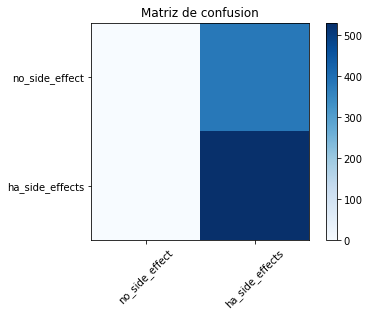

In [75]:
cm_plot_label = ['no_side_effect','ha_side_effects']
plot_confusion_matrix(cm_fruit, cm_plot_label, title='Matriz de confusion')

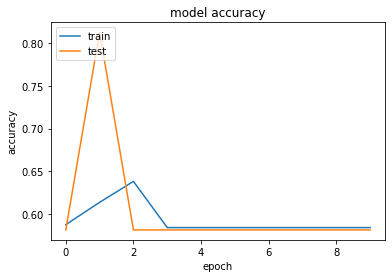

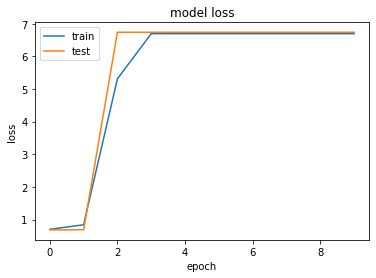

In [76]:
# summarize history for accuracy
plt.plot(history_fruit.history['acc'])
plt.plot(history_fruit.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history_fruit.history['loss'])
plt.plot(history_fruit.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [77]:
probs_fruit = model_fruit.predict_proba(X_test)

In [78]:
probs_fruit = probs_fruit[:, 1]

In [79]:
auc_fruit = roc_auc_score(Y_test.argmax(axis=1), probs_fruit)

In [80]:
fpr, tpr, thresholds = roc_curve(Y_test.argmax(axis=1), probs_fruit)

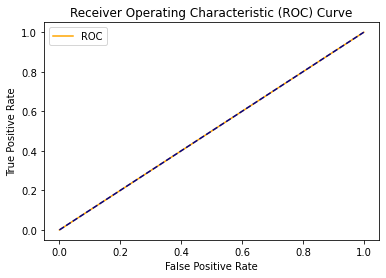

In [81]:
plot_roc_curve(fpr, tpr)

# Modelo de red utilizado para Hojas de tomate, (Adaptado)

In [82]:
model_tomaco = Sequential()

model_tomaco.add(Conv2D(128, kernel_size=(3, 3), input_shape=(100, 100, 3)))
model_tomaco.add(Conv2D(64,(3,3), activation='relu'))
model_tomaco.add(MaxPooling2D())
model_tomaco.add(MaxPooling2D())
model_tomaco.add(BatchNormalization())

model_tomaco.add(Conv2D(64,(3,3), activation='relu'))
model_tomaco.add(Conv2D(64,(3,3), activation='relu'))
model_tomaco.add(Conv2D(64,(3,3), activation='relu'))
model_tomaco.add(MaxPooling2D())
model_tomaco.add(MaxPooling2D())
model_tomaco.add(MaxPooling2D())
model_tomaco.add(BatchNormalization())
#model_tomaco.add(Reshape())
model_tomaco.add(Flatten())
model_tomaco.add(Dense(2, activation='softmax'))



#REDUCE DEMACIADO EL TAMA;O DE LA IMAGEN

#model_tomaco.add(Conv2D(64,(3,3)))
#model_tomaco.add(MaxPooling2D(pool_size=(2,2)))
#model_tomaco.add(BatchNormalization())
#model_tomaco.add(AveragePooling2D())
#model_tomaco.add(Conv2D(64,(3,3), activation='relu'))
#model_tomaco.add(Lambda())
#model_tomaco.add(Conv2D(32,(3,3), activation='relu'))
#model_tomaco.add(Reshape())

model_tomaco.summary()

W0530 02:32:24.951869  8144 deprecation_wrapper.py:119] From C:\Users\x-30679\Miniconda3\lib\site-packages\keras\backend\tensorflow_backend.py:1834: The name tf.nn.fused_batch_norm is deprecated. Please use tf.compat.v1.nn.fused_batch_norm instead.



_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_15 (Conv2D)           (None, 98, 98, 128)       3584      
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 96, 96, 64)        73792     
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 48, 48, 64)        0         
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 24, 24, 64)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 24, 24, 64)        256       
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 22, 22, 64)        36928     
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 20, 20, 64)        36928     
__________

In [83]:
model_tomaco.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=keras.optimizers.Adadelta(),
              metrics=['accuracy'])

In [84]:
history_tomaco= model_tomaco.fit(X_train, Y_train,
          batch_size=64,
          epochs=10,
          verbose=1,
          validation_data=(X_test, Y_test))
score = model_tomaco.evaluate(X_test, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 3805 samples, validate on 911 samples
Epoch 1/10
3805/3805 [==============================] - 11s 3ms/step - loss: 0.0780 - acc: 0.9674 - val_loss: 0.3528 - val_acc: 0.8727
Epoch 2/10
3805/3805 [==============================] - 9s 2ms/step - loss: 0.0168 - acc: 0.9942 - val_loss: 0.5776 - val_acc: 0.8200
Epoch 3/10
3805/3805 [==============================] - 9s 2ms/step - loss: 0.0310 - acc: 0.9882 - val_loss: 0.1249 - val_acc: 0.9473
Epoch 4/10
3805/3805 [==============================] - 9s 2ms/step - loss: 0.0165 - acc: 0.9942 - val_loss: 0.6506 - val_acc: 0.8046
Epoch 5/10
3805/3805 [==============================] - 9s 2ms/step - loss: 0.0123 - acc: 0.9963 - val_loss: 0.9145 - val_acc: 0.7124
Epoch 6/10
3805/3805 [==============================] - 9s 2ms/step - loss: 0.0066 - acc: 0.9984 - val_loss: 0.0133 - val_acc: 0.9956
Epoch 7/10
3805/3805 [==============================] - 9s 2ms/step - loss: 0.0118 - acc: 0.9953 - val_loss: 1.5143 - val_acc: 0.6334
Epoch 8/10
380

In [85]:
#Matriz de confusion

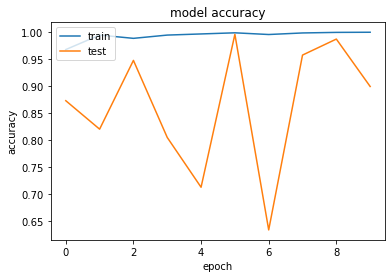

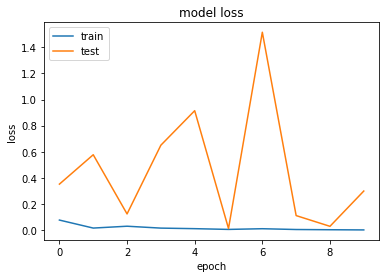

In [86]:
# summarize history for accuracy
plt.plot(history_tomaco.history['acc'])
plt.plot(history_tomaco.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history_tomaco.history['loss'])
plt.plot(history_tomaco.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

La matriz de confusion sin normalizar
[[381   0]
 [ 92 438]]


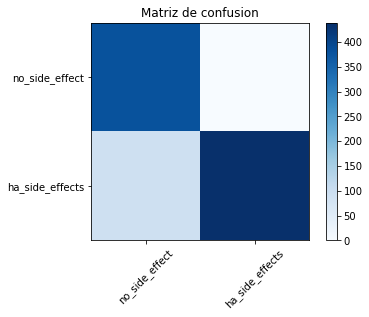

In [87]:
prediccion_tomaco = model_tomaco.predict_classes(X_test)
cm_tomaco = confusion_matrix(Y_test.argmax(axis=1), prediccion_tomaco)
cm_plot_label = ['no_side_effect','ha_side_effects']
plot_confusion_matrix(cm_tomaco, cm_plot_label, title='Matriz de confusion')

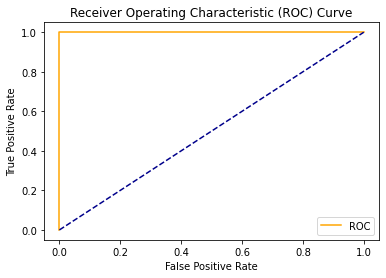

In [88]:
probs_tomaco = model_tomaco.predict_proba(X_test)
probs_tomaco = probs_tomaco[:, 1]
auc_tomaco = roc_auc_score(Y_test.argmax(axis=1), probs_tomaco)
fpr_tomaco, tpr_tomaco, thresholds = roc_curve(Y_test.argmax(axis=1), probs_tomaco)
plot_roc_curve(fpr_tomaco, tpr_tomaco)